# Clustering

In [1]:
# rdkit mols are displayed as images
from rdkit.Chem.Draw import IPythonConsole

from rdkit.Chem import AllChem as Chem
from rdkit import DataStructs

# descriptors
from rdkit.Chem import Lipinski
from rdkit.Chem import rdMolDescriptors
from rdkit.Chem import Descriptors

# diversity picker
from rdkit.SimDivFilters.rdSimDivPickers import MaxMinPicker

# plots
from matplotlib import pyplot
import seaborn

# scikit learn
# conda install -c conda-forge scikit-learn 
from scipy.spatial import distance
from sklearn import manifold
from sklearn import decomposition
from sklearn import preprocessing
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import KMeans

# other packages
import pandas as pd
import csv
import re

In [12]:
import numpy as np

In [2]:
float_pattern = re.compile("[0-9]+(\.[0-9]*)?")

In [3]:
lip_func = [("HBA", Lipinski.NumHAcceptors), 
            ("HBD", Lipinski.NumHDonors), 
            ("MW", Descriptors.ExactMolWt),
            ("LogP", Descriptors.MolLogP), 
            ("TPSA", rdMolDescriptors.CalcTPSA), 
            ("RB", Lipinski.NumRotatableBonds)]

In [4]:
with open('./data/DOWNLOAD-ligands_for_serotonine_rec.csv', 'r') as csvfile:
    serotonine_ligands = [row for row in csv.DictReader(csvfile, delimiter=";", quotechar='"')]
    for m in serotonine_ligands:
        m["rdmol"] = Chem.MolFromSmiles(m["Smiles"])
        m["source"] = "serotonine"
        m["pChEMBL_value"] = float(m["pChEMBL Value"]) if float_pattern.match(m["pChEMBL Value"]) else 0
        m["fps"] = Chem.GetMorganFingerprintAsBitVect(m["rdmol"],2,nBits=1024)
        m["RO5_viol"] = m["#RO5 Violations"]
        for f in lip_func:
            m[f[0]] = f[1](m["rdmol"])

In [5]:
drugbank = [{"rdmol": m,
             "source": "drugbank",
             "Smiles": Chem.MolToSmiles(m),
             "pChEMBL_value": 0,
             "fps": Chem.GetMorganFingerprintAsBitVect(m, 2, nBits=1024),
             **{f[0]: f[1](m) for f in lip_func}
            } for m in Chem.SDMolSupplier("../data/drugbank.sdf") if m
           ]

In [6]:
df = pd.DataFrame((*drugbank, *serotonine_ligands), columns=["Smiles", "source", "rdmol", "fps", "pChEMBL_value", *(f[0] for f in lip_func)])
df.reset_index(level=0, inplace=True)

### Add MQN descriptors

In [7]:
df = df.join(pd.DataFrame((rdMolDescriptors.MQNs_(mol) for mol in df["rdmol"]),
                          columns=[*(f"MQN_{x}" for x in range(1,43))])
            )

In [8]:
norm = preprocessing.normalize(df[(f"MQN_{x}" for x in range(1, 43))])
pca = decomposition.PCA(n_components=42)
pca.fit(norm)
df = df.join(pd.DataFrame(pca.transform(norm), columns=[f"nPCA_{x}" for x in range(1, 43)]))

In [9]:
sparse_mat = distance.pdist(list(df["fps"]),metric="jaccard")
dist_mat = distance.squareform(sparse_mat)

In [10]:
clf = manifold.MDS(n_components=2, n_init=1, max_iter=100, dissimilarity="precomputed")
X_mds = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_mds, columns=["mds_x","mds_y"]))

In [11]:
clf = manifold.TSNE(n_components=2, metric="precomputed")
X_tsne = clf.fit_transform(dist_mat)
df = df.join(pd.DataFrame(X_tsne, columns=["tsne_x", "tsne_y"]))

## Evaluation of clustering

In [71]:
def confusion_matrix(true_classes, clusters, title):
    classes = np.array(true_classes)
    labels = set(clusters)
    label_dict = {}
    TP = 0  # ligand classified as ligand
    TN = 0  # drug classified as drug
    FP = 0  # drug classified as ligand
    FN = 0  # ligand classified as drug
    for label in labels:
        mask = clusters == label
        count_drugs = sum(1 for c in classes[mask] if c == "drugbank")
        count_serotonine = sum(1 for c in classes[mask] if c == "serotonine")
        if count_drugs >= count_serotonine:
            classification = "drugbank"
        else:
            classification = "serotonine"
        label_dict[label] = classification
        if classification == "drugbank":
            TN += count_drugs
            FN += count_serotonine
            
        else:
            TP += count_serotonine
            FP += count_drugs
        acc = (TP + TN) / (FP + FN + TP + TN)
    
    print(title)
    print("", "T", "N")
    print("T", TP, FP)
    print("F", FN, TN)
    print(f"Accuracy: {acc}")
    print()

## Hierarchical clustering

ward
 T N
T 455 200
F 1421 6915
Accuracy: 0.8197085974863753

average
 T N
T 0 0
F 1876 7115
Accuracy: 0.7913469024580135

complete
 T N
T 132 117
F 1744 6998
Accuracy: 0.7930152374596819

single
 T N
T 32 0
F 1844 7115
Accuracy: 0.7949060171282394



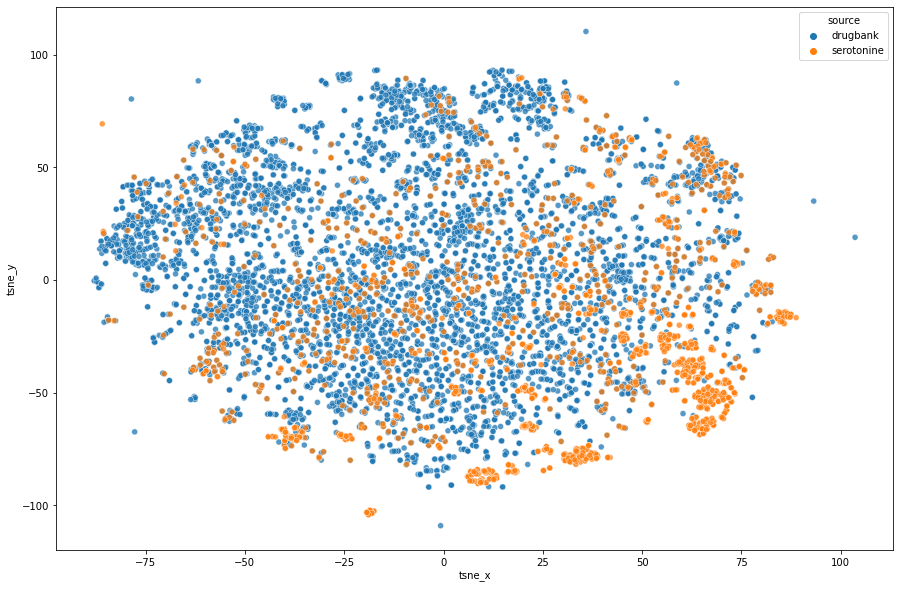

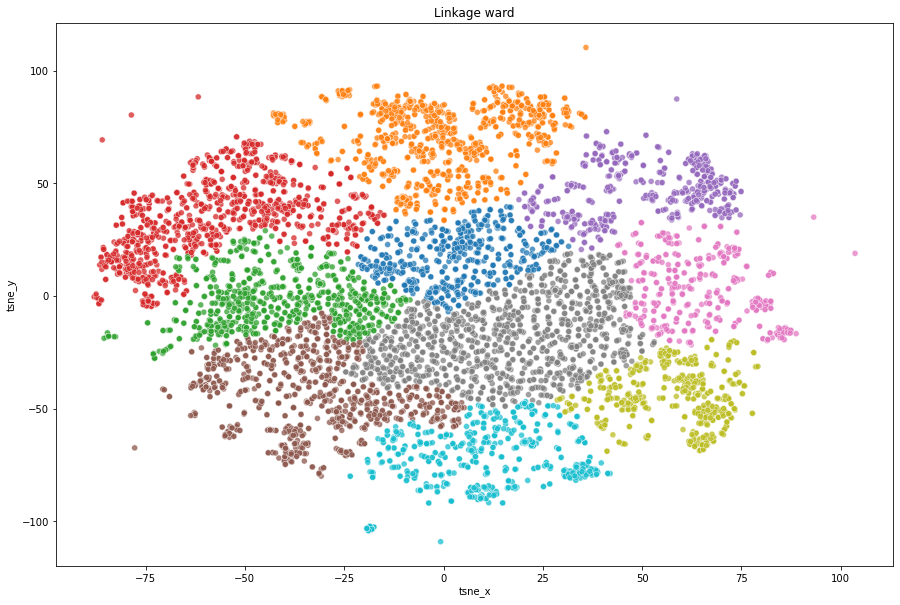

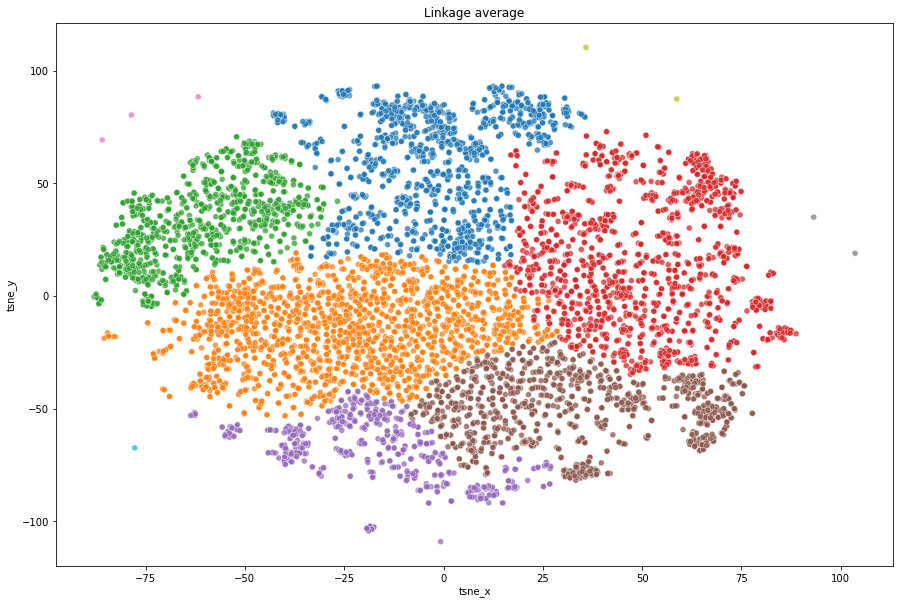

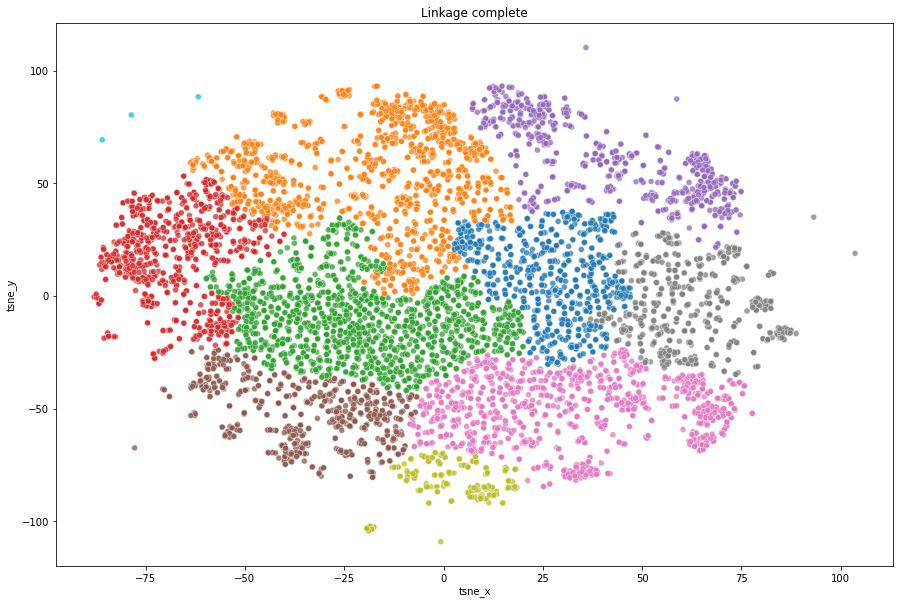

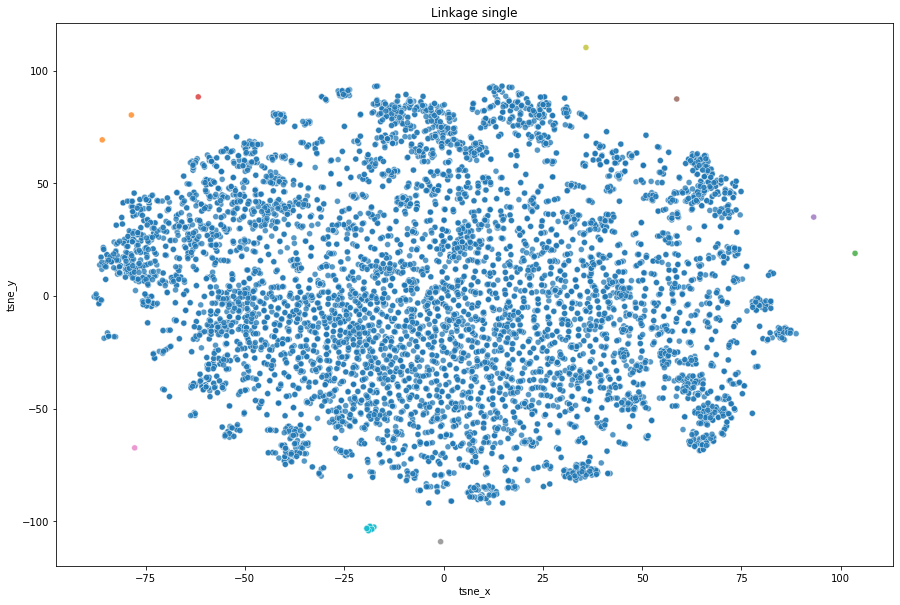

In [72]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[["tsne_x", "tsne_y"]])
    
    confusion_matrix(df["source"], clustering.labels_, linkage)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                     ).set_title(f"Linkage {linkage}")


All of these methods give reasonable clustering, maybe except single linkage. At firset glance, average linkage gives the best clustering based on the two used datasets.

ward
 T N
T 0 0
F 1876 7115
Accuracy: 0.7913469024580135

average
 T N
T 32 0
F 1844 7115
Accuracy: 0.7949060171282394

complete
 T N
T 32 3
F 1844 7112
Accuracy: 0.7945723501279057

single
 T N
T 32 0
F 1844 7115
Accuracy: 0.7949060171282394



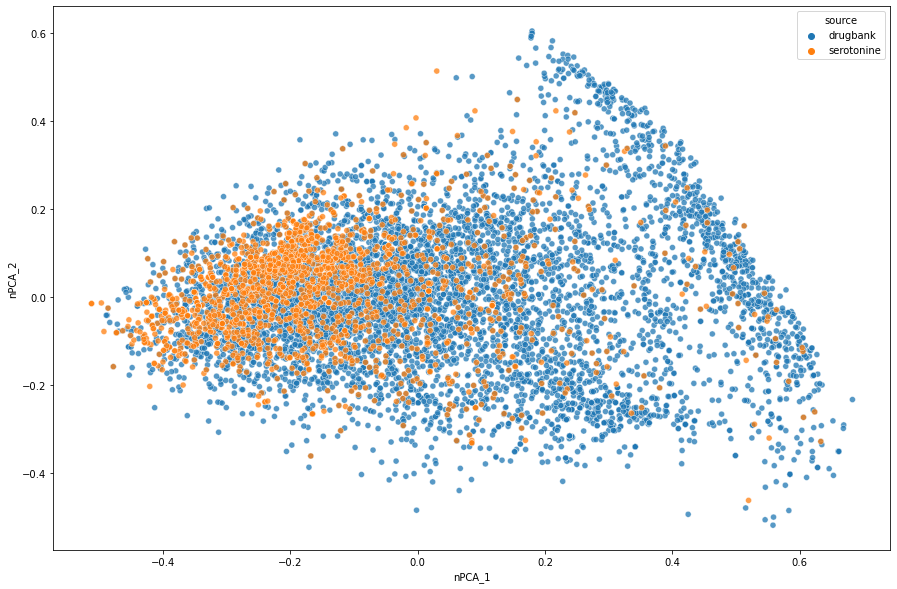

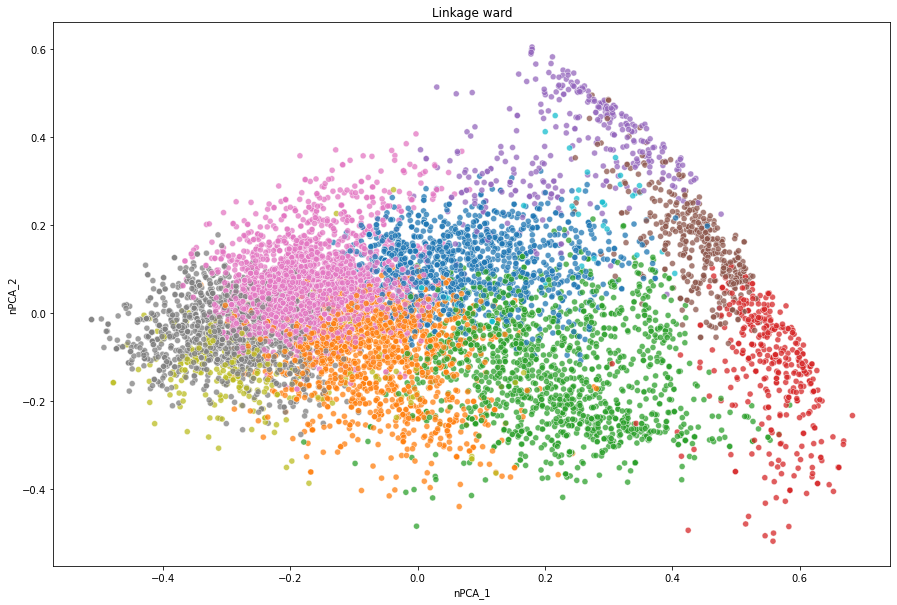

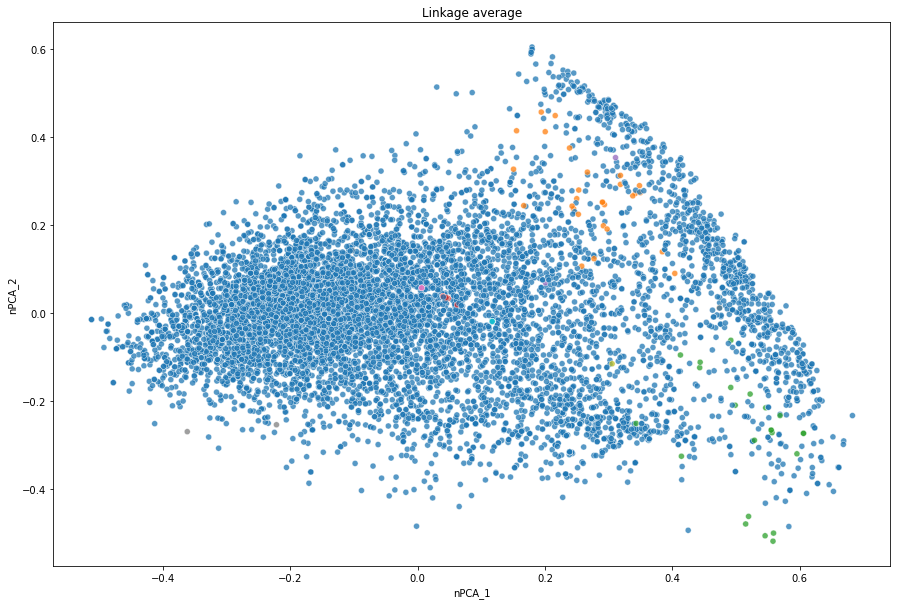

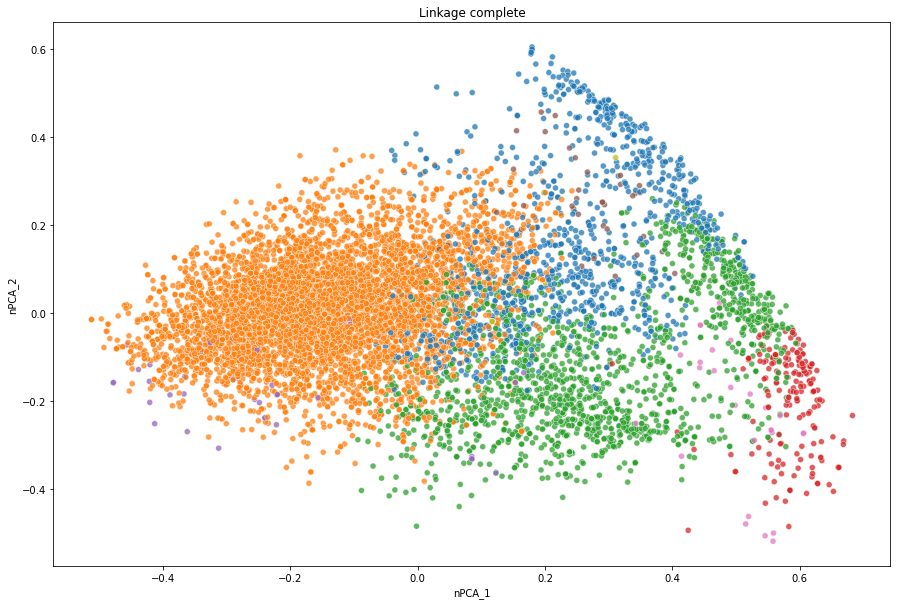

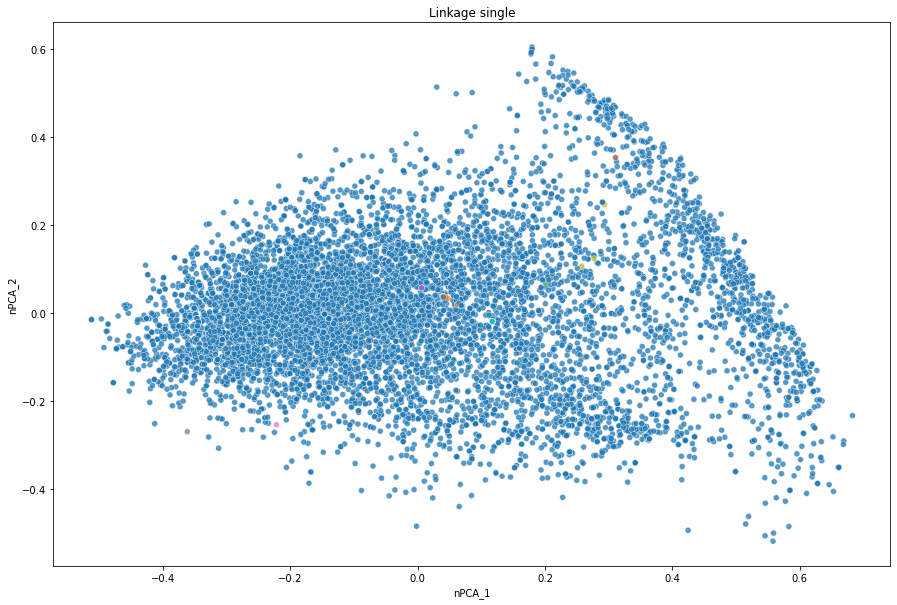

In [73]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('ward', 'average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, n_clusters=10)
    clustering.fit(df[[f"nPCA_{x}" for x in range(1, 43)]])
    
    confusion_matrix(df["source"], clustering.labels_, linkage)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="nPCA_1",
                      y="nPCA_2",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

Average and single don't seem to helpful, ward and complete give better clustering. Maybe the clusters from complete are too big and the ones from ward would be more useful.

## K-means

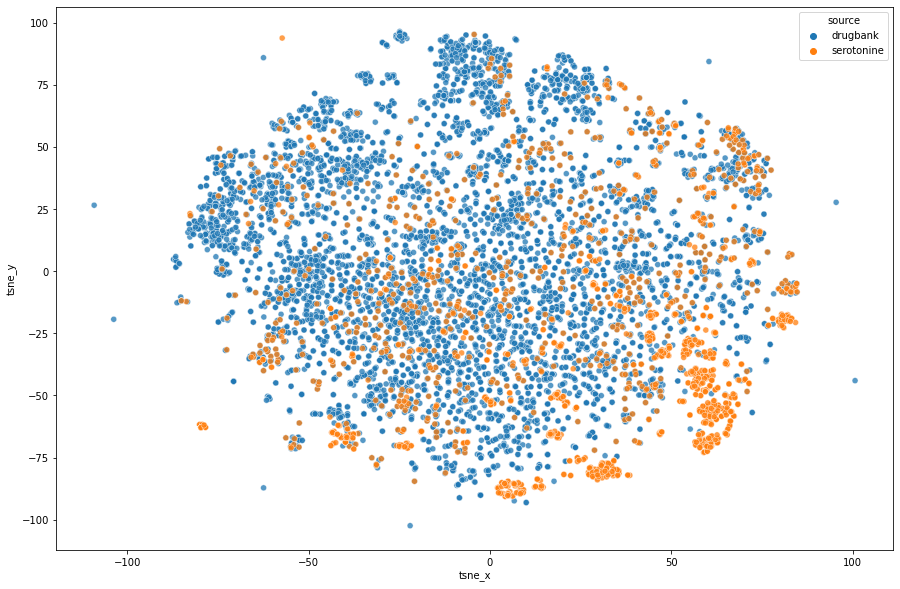

In [18]:
# First unclustered data, for reference...
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

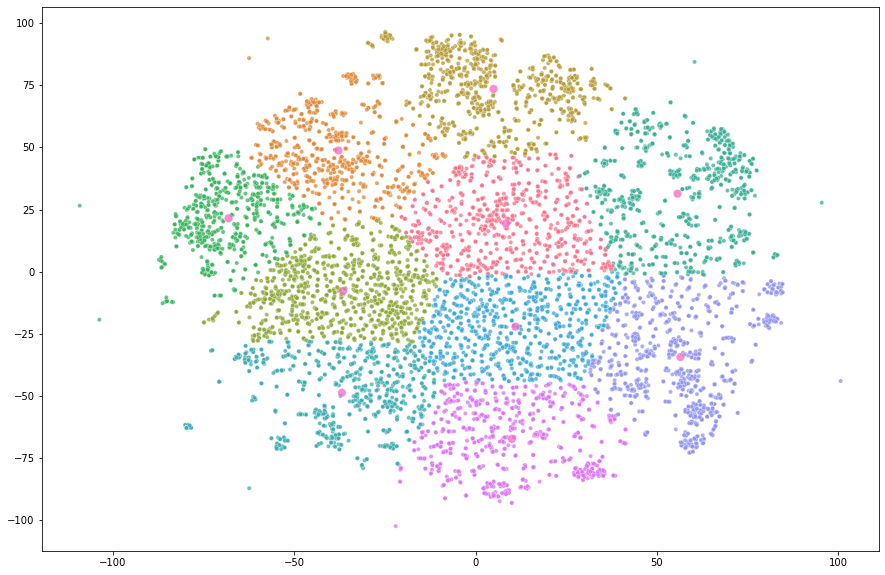

In [16]:
reduced_data = df[["tsne_x", "tsne_y"]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_
# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["tsne_x"], *centroids[:, 0]],
                  y=[*df["tsne_y"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+1)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )

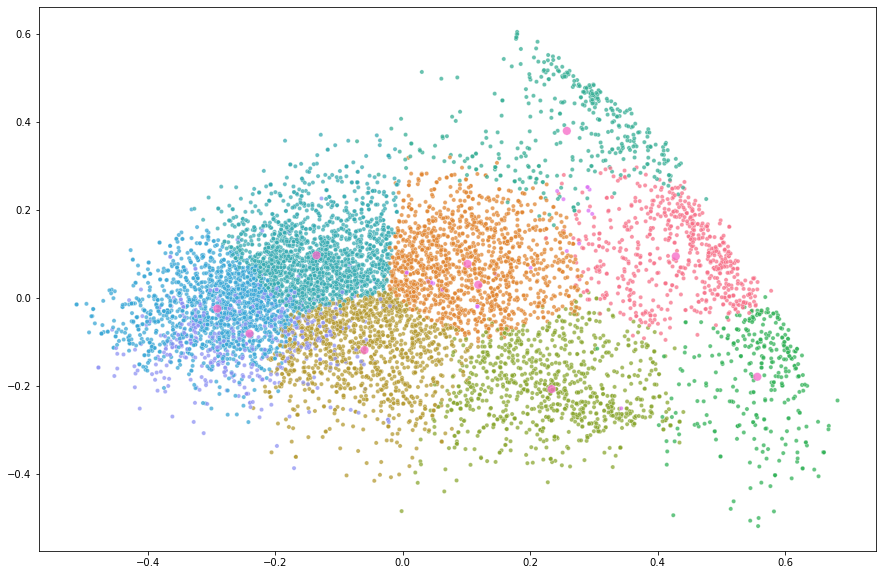

In [19]:
reduced_data = df[[f"nPCA_{x}" for x in range(1, 43)]]
n_clusters = 10
kmeans = KMeans(init="k-means++", n_clusters=n_clusters, n_init=4)
kmeans.fit(reduced_data)
centroids = kmeans.cluster_centers_

# Put the result into a color plot
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x= [*df["nPCA_1"], *centroids[:, 0]],
                  y=[*df["nPCA_2"], *centroids[:, 1]],
                  hue=[pyplot.cm.nipy_spectral(l / (n_clusters+3)) for l in (*kmeans.labels_, *(n_clusters for x in range(len(centroids))))],
                  size=[*[1 for l in kmeans.labels_],*[50 for x in range(len(centroids))]],
                  ax=ax,
                  alpha=0.75,
                  legend=False 
                 )

average
 T N
T 32 0
F 1844 7115
Accuracy: 0.7949060171282394

complete
 T N
T 32 0
F 1844 7115
Accuracy: 0.7949060171282394

single
 T N
T 32 0
F 1844 7115
Accuracy: 0.7949060171282394



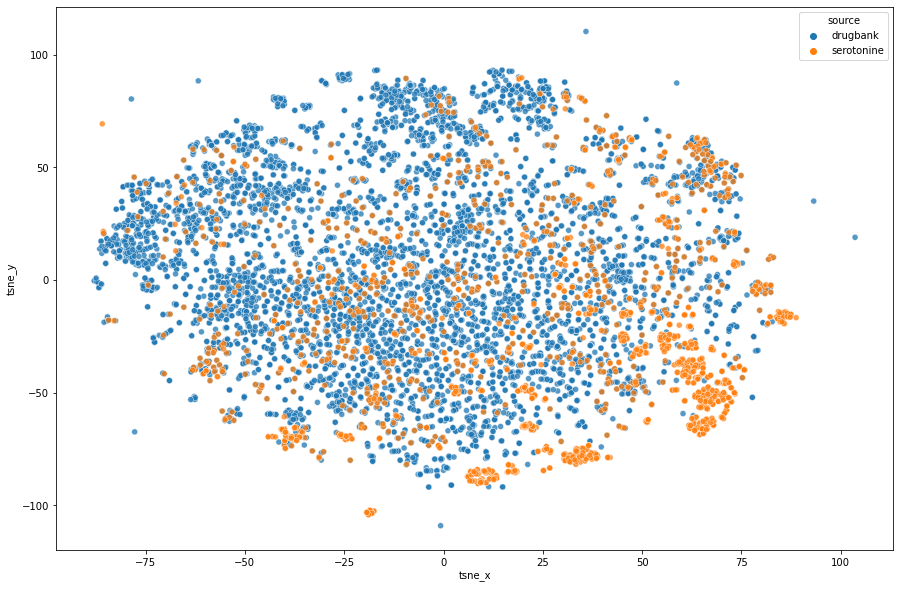

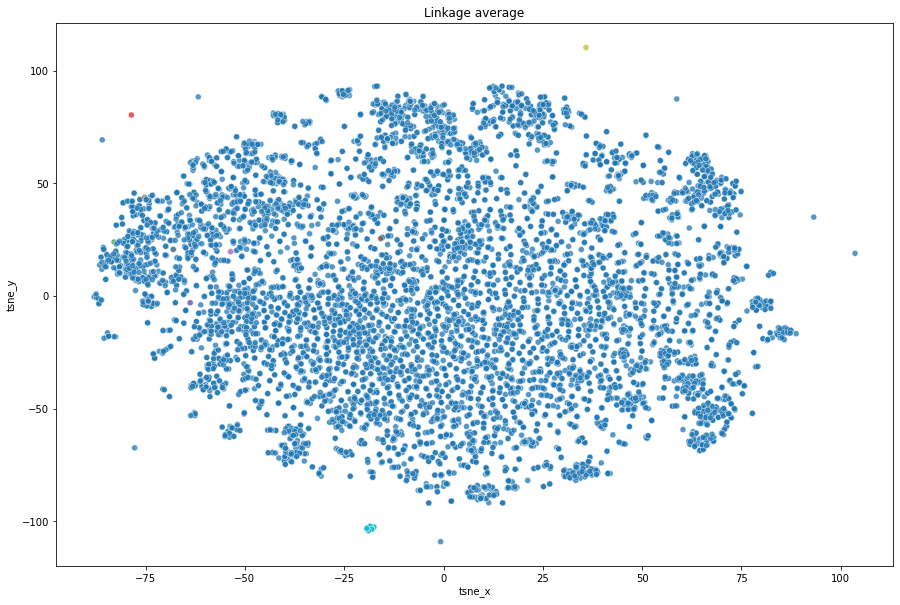

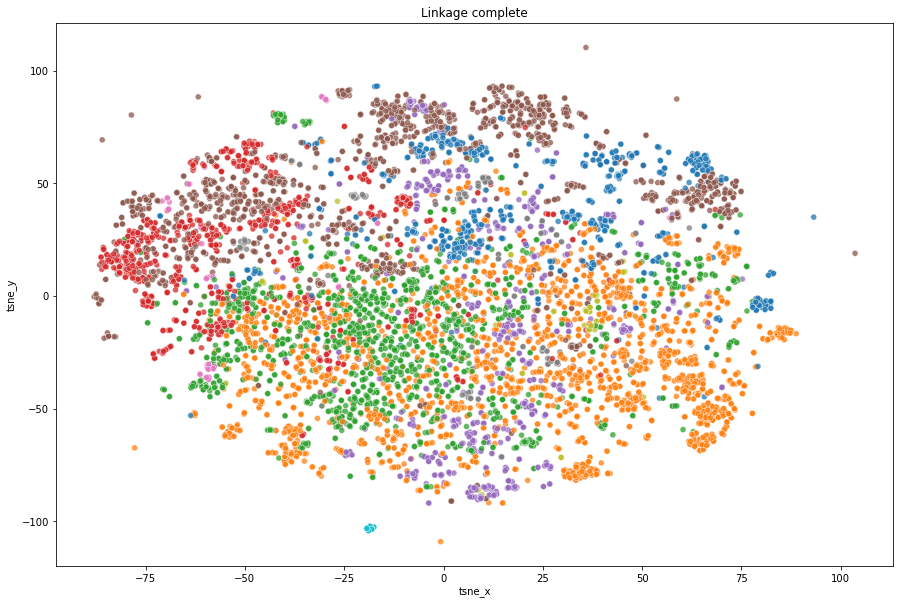

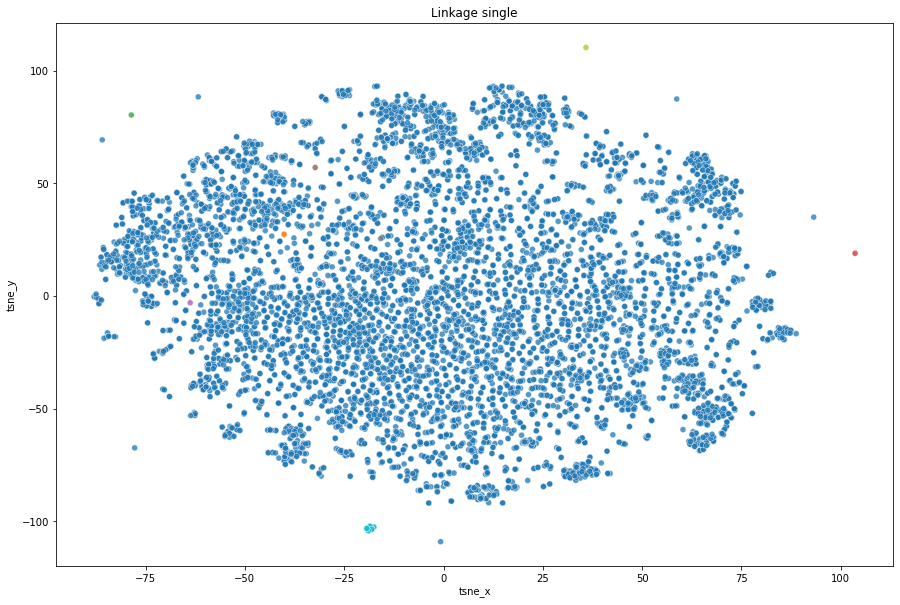

In [74]:
n_clusters = 10
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for linkage in ('average', 'complete', 'single'):
    clustering = AgglomerativeClustering(linkage=linkage, affinity="precomputed", n_clusters=n_clusters)
    clustering.fit(dist_mat)
    
    confusion_matrix(df["source"], clustering.labels_, linkage)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

Complete linkage with precomputed distances kind of seems to pick up the differences between the serotonine receptor ligand set and DrugBank.

3
 T N
T 0 0
F 1876 7115
Accuracy: 0.7913469024580135

5
 T N
T 0 0
F 1876 7115
Accuracy: 0.7913469024580135

10
 T N
T 32 0
F 1844 7115
Accuracy: 0.7949060171282394

15
 T N
T 32 0
F 1844 7115
Accuracy: 0.7949060171282394



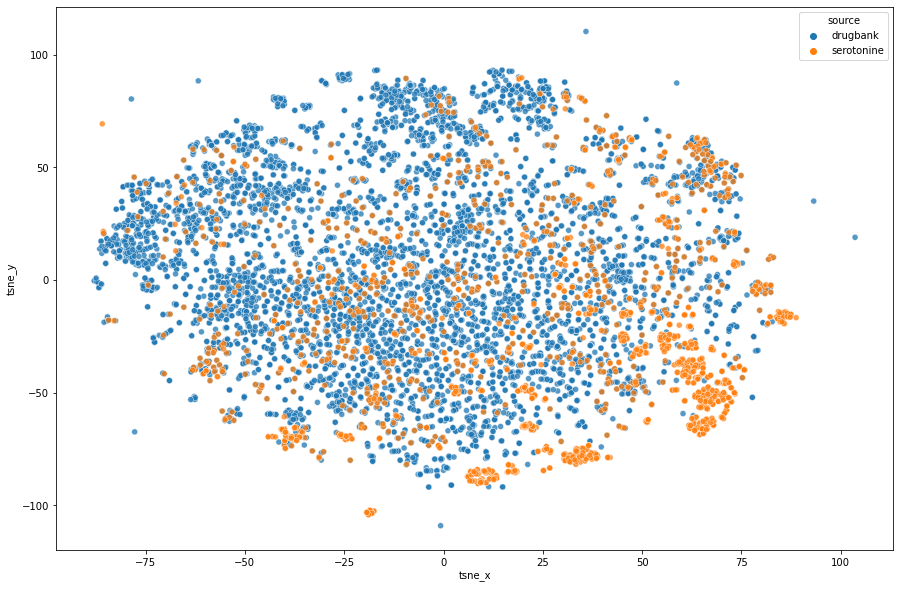

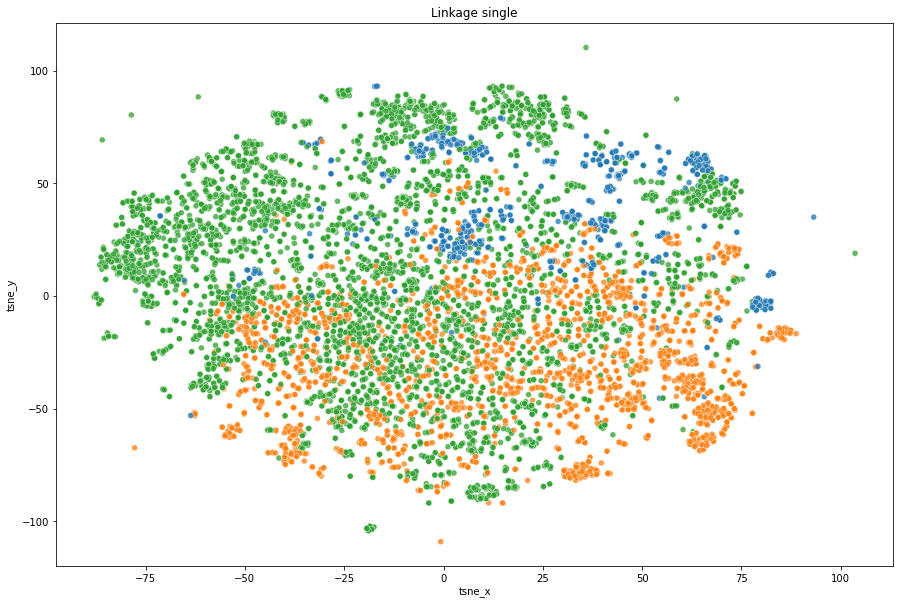

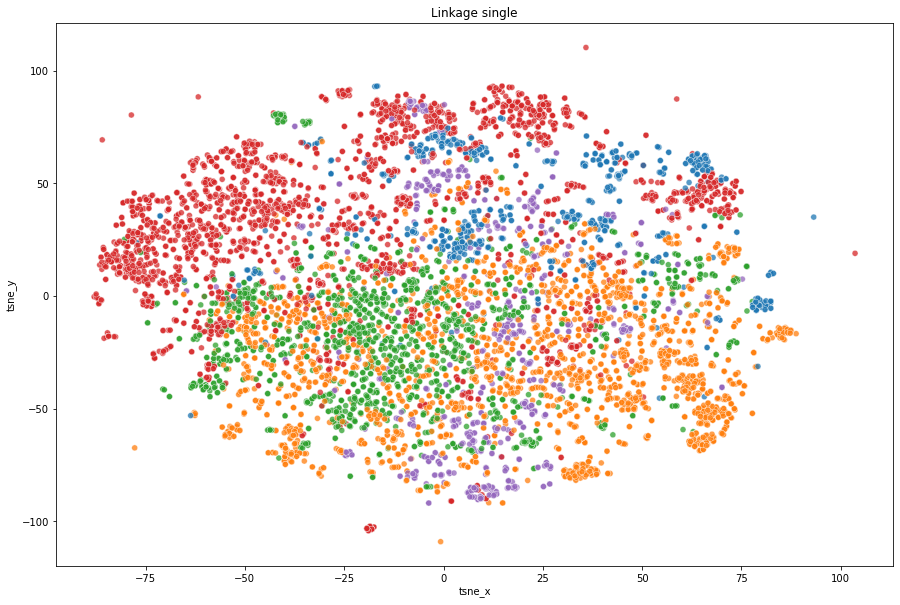

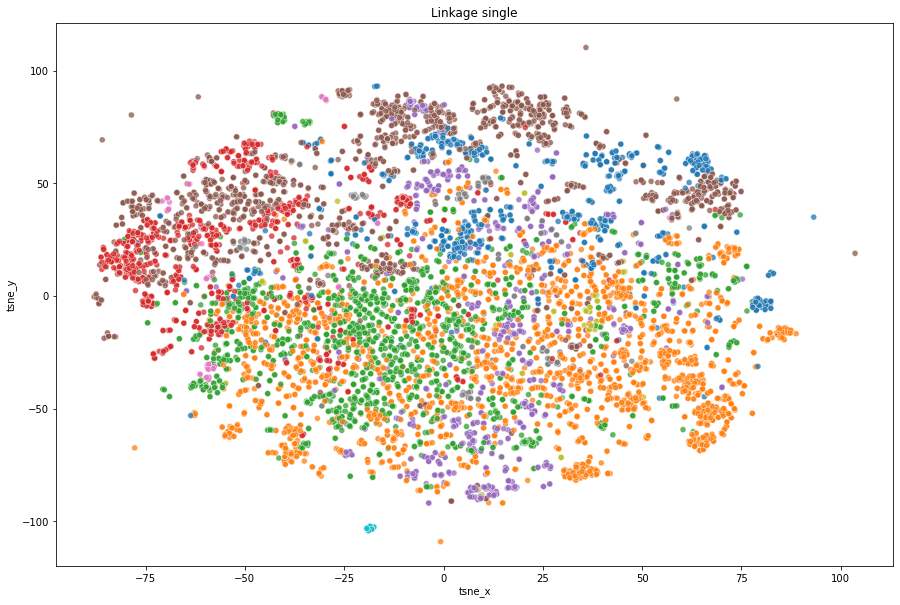

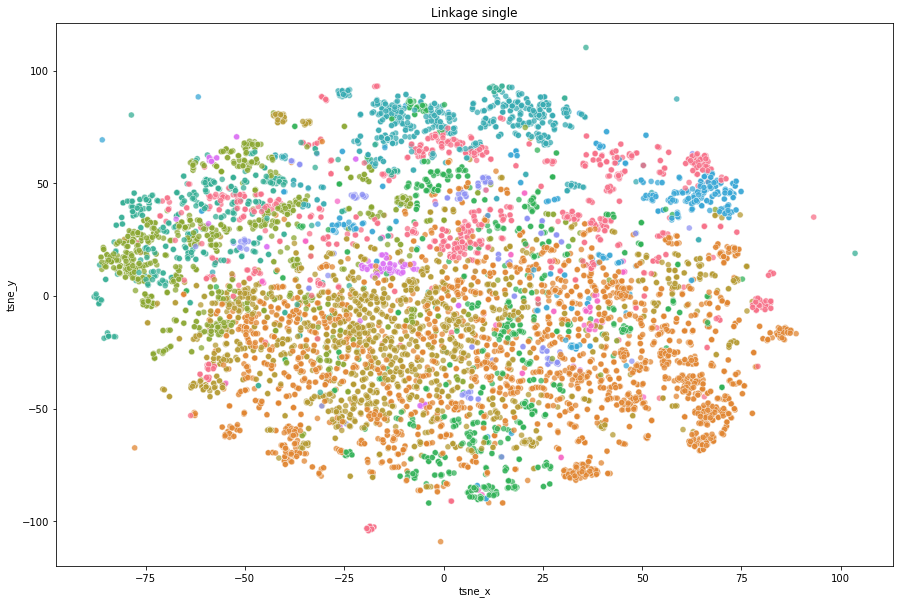

In [77]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for size in (3, 5, 10, 15):
    clustering = AgglomerativeClustering(linkage="complete", affinity="precomputed", n_clusters=size)
    clustering.fit(dist_mat)
    
    confusion_matrix(df["source"], clustering.labels_, size)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / n_clusters) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False,
                     ).set_title(f"Linkage {linkage}")

Visually, the separation looks good. But in comparison with clustering the t-sne values using Ward metricm the accuracy is worse (and the confusion matrix looks worse).

In [76]:
clustering.labels_

array([11, 11, 11, ...,  3,  3,  3], dtype=int64)

Since it seems that hierarchical clustering using t-sne values and Ward method gave the best results in the beginning, let's try it with different cluster sizes:

3
 T N
T 0 0
F 1876 7115
Accuracy: 0.7913469024580135

5
 T N
T 785 587
F 1091 6528
Accuracy: 0.8133689244800356

8
 T N
T 455 200
F 1421 6915
Accuracy: 0.8197085974863753

10
 T N
T 455 200
F 1421 6915
Accuracy: 0.8197085974863753

15
 T N
T 455 200
F 1421 6915
Accuracy: 0.8197085974863753

20
 T N
T 653 318
F 1223 6797
Accuracy: 0.8286063841619398



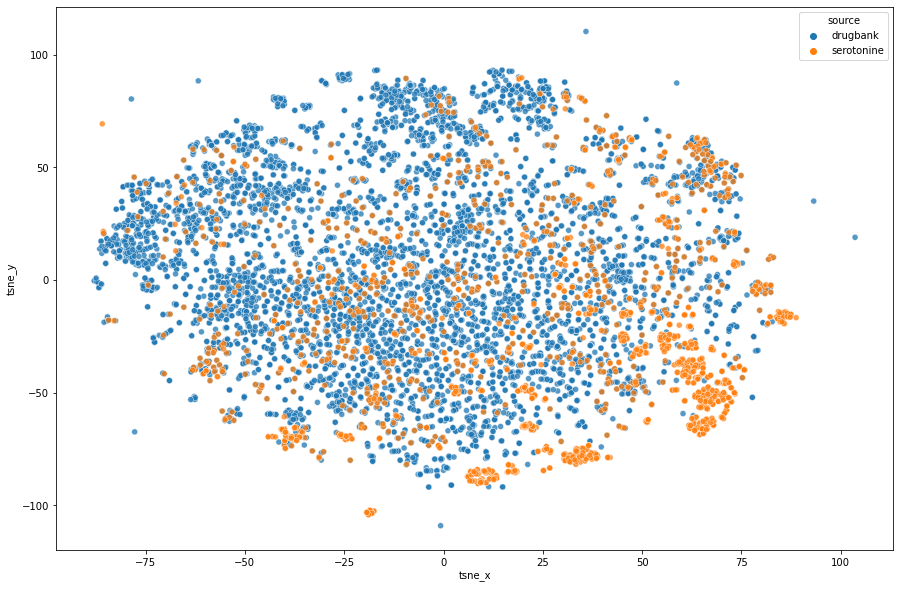

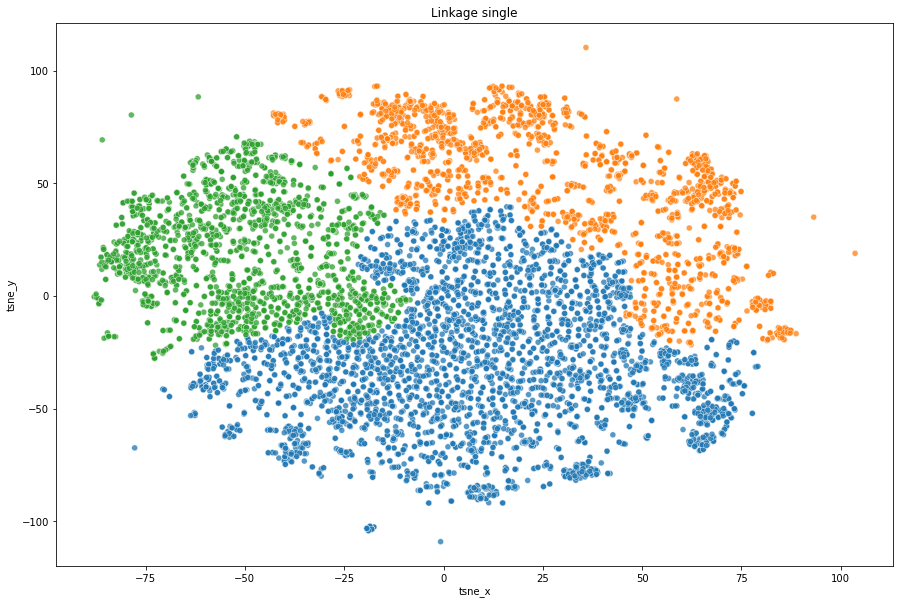

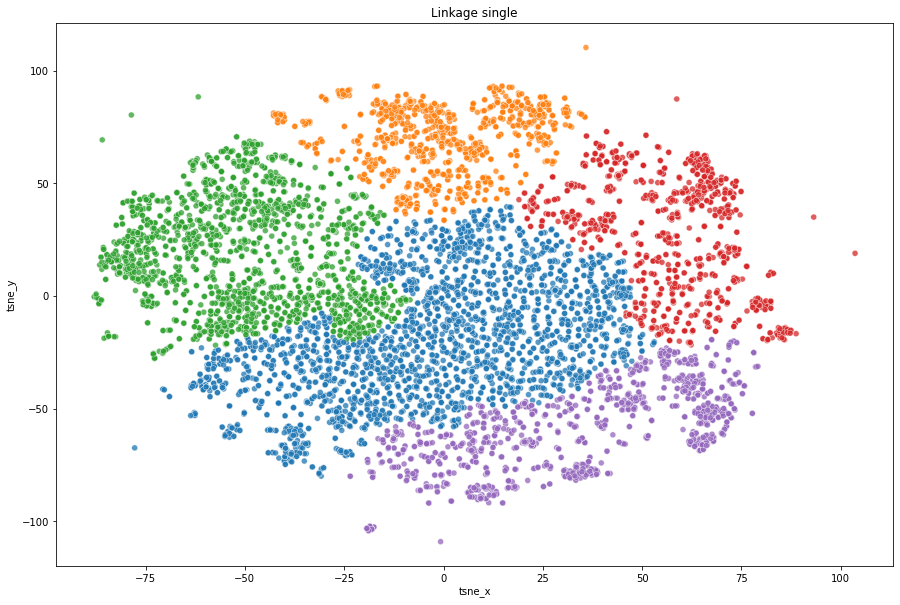

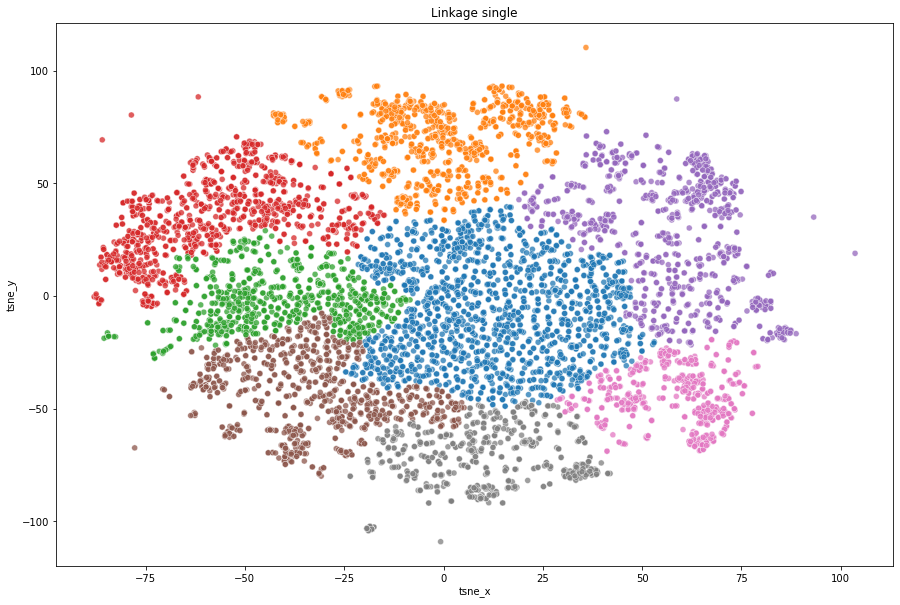

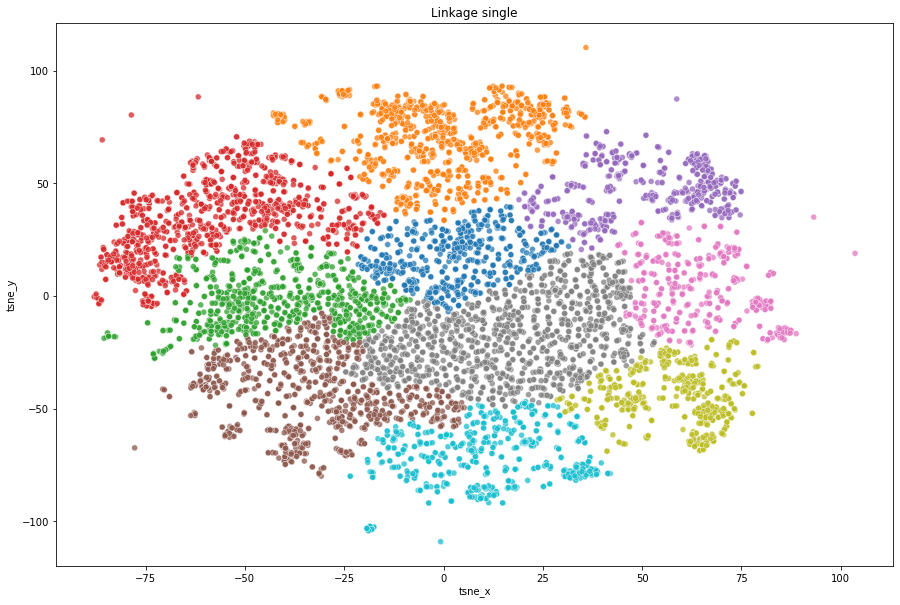

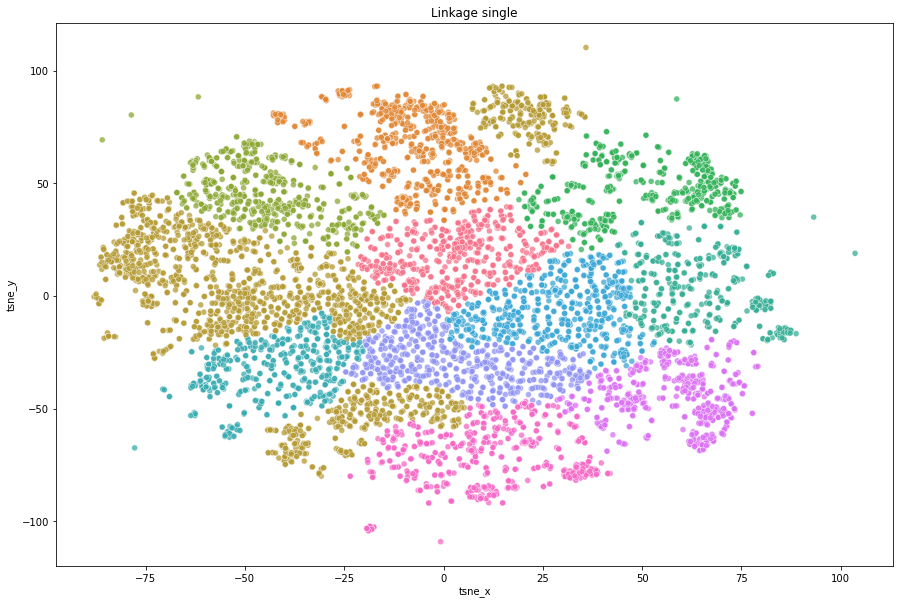

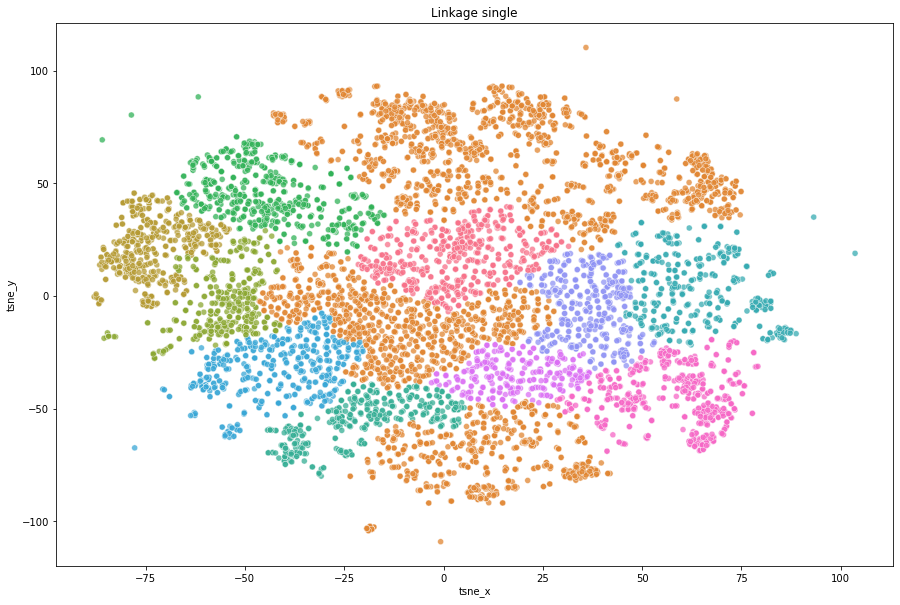

In [79]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for size in [3,5, 8,10,15, 20]:
    clustering = AgglomerativeClustering(linkage='ward', n_clusters=size)
    clustering.fit(df[["tsne_x", "tsne_y"]])
    
    confusion_matrix(df["source"], clustering.labels_, size)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                     ).set_title(f"Linkage {linkage}")

Here I would say that 5 clusters is the best. 8, 10 and 15 gives better accuracy, but 5 gives the most true positives. 
Let's also try 6 and 7:

6
 T N
T 785 587
F 1091 6528
Accuracy: 0.8133689244800356

7
 T N
T 455 200
F 1421 6915
Accuracy: 0.8197085974863753

9
 T N
T 455 200
F 1421 6915
Accuracy: 0.8197085974863753



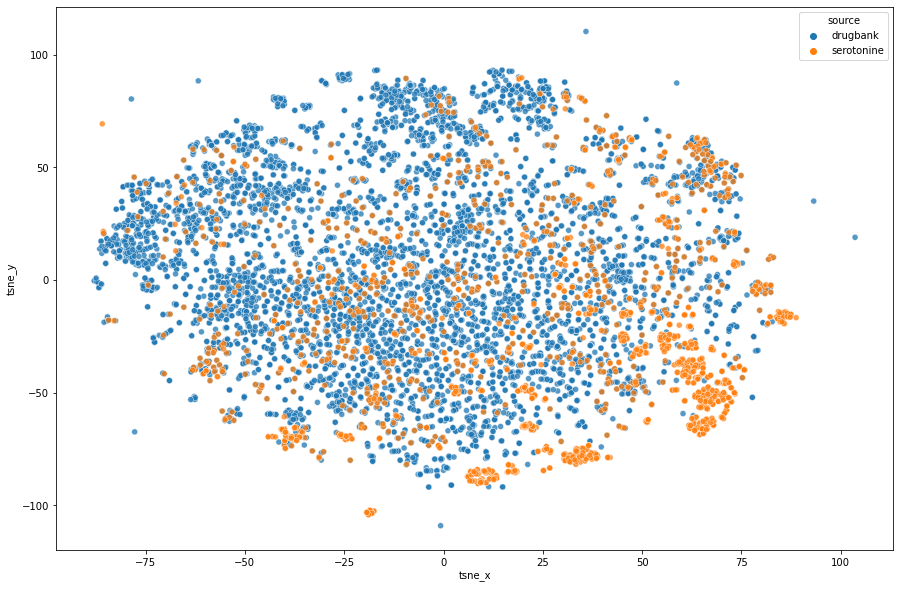

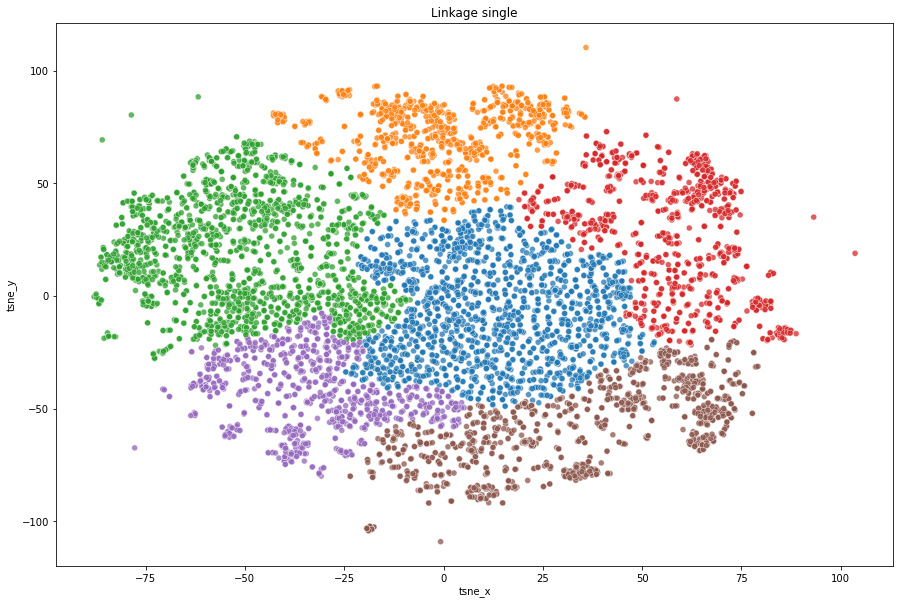

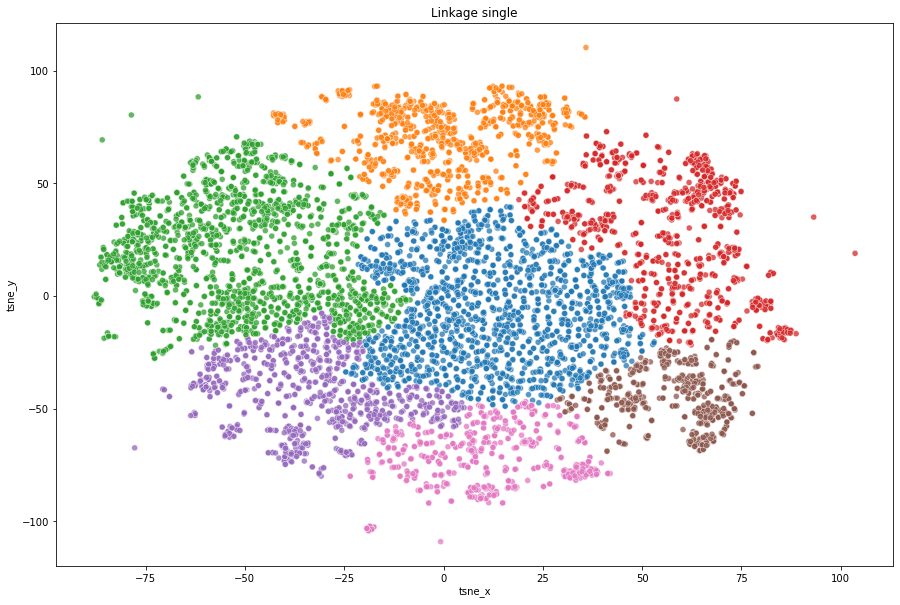

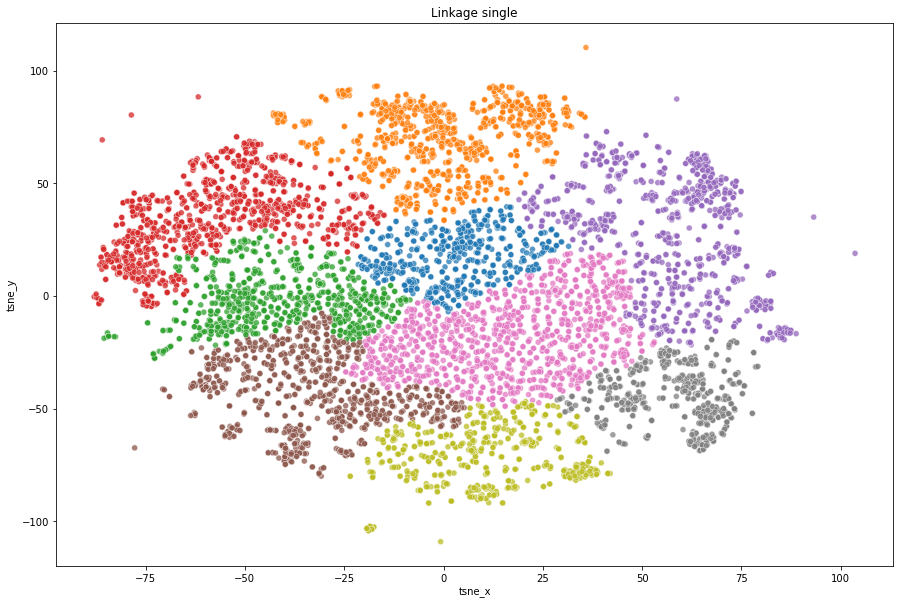

In [80]:
fig, ax = pyplot.subplots(figsize=(15,10))
p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue="source",
                      legend="brief",
                      ax=ax,
                      alpha=0.75
                     )

for size in [6, 7, 9]:
    clustering = AgglomerativeClustering(linkage='ward', n_clusters=size)
    clustering.fit(df[["tsne_x", "tsne_y"]])
    
    confusion_matrix(df["source"], clustering.labels_, size)

    fig, ax = pyplot.subplots(figsize=(15,10))
    p=seaborn.scatterplot(x="tsne_x",
                      y="tsne_y",
                      data=df,
                      hue=[pyplot.cm.nipy_spectral(l / 10.) for l in clustering.labels_],
                      ax=ax,
                      alpha=0.75,
                      legend=False
                     ).set_title(f"Linkage {linkage}")

Ok, 5 is still the winner (6 is the same).